In [ ]:
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
from scipy.stats import shapiro, anderson, kstest, ks_2samp, chisquare


In [ ]:
data = requests.get("http://localhost:8082/api/dailyprices/weekly/ADH?start=2020-05-22&finish=2026-03-20")

In [ ]:
sorted_data = {k: v for k, v in sorted(data.json().items(), key=lambda item: item[0], reverse=False)}

In [ ]:
pd.DataFrame(sorted_data).T

,ticker,week_start,weekly_log_return
2023-02-21,ADH,2023-02-21,-0.008352
2023-02-28,ADH,2023-02-28,0.017444
2023-03-07,ADH,2023-03-07,-0.012035
2023-03-14,ADH,2023-03-14,-0.021552
2023-03-21,ADH,2023-03-21,-0.007687
...,...,...,...
2025-03-18,ADH,2025-03-18,0.049502
2025-03-25,ADH,2025-03-25,-0.008772
2025-04-01,ADH,2025-04-01,-0.011462
2025-04-08,ADH,2025-04-08,-0.016786


In [ ]:
data.json()

{'2024-12-31': {'ticker': 'ADH',
  'week_start': '2024-12-31',
  'weekly_log_return': 0.055994295407335526},
 '2025-03-11': {'ticker': 'ADH',
  'week_start': '2025-03-11',
  'weekly_log_return': 0},
 '2024-07-02': {'ticker': 'ADH',
  'week_start': '2024-07-02',
  'weekly_log_return': 0.00722491549286464},
 '2024-09-24': {'ticker': 'ADH',
  'week_start': '2024-09-24',
  'weekly_log_return': 0.01920469701671227},
 '2023-05-09': {'ticker': 'ADH',
  'week_start': '2023-05-09',
  'weekly_log_return': 0.02880991273971896},
 '2023-08-08': {'ticker': 'ADH',
  'week_start': '2023-08-08',
  'weekly_log_return': 0.009665358185080346},
 '2023-05-16': {'ticker': 'ADH',
  'week_start': '2023-05-16',
  'weekly_log_return': -0.019105312087807847},
 '2024-01-16': {'ticker': 'ADH',
  'week_start': '2024-01-16',
  'weekly_log_return': 0.030349070387176602},
 '2023-08-01': {'ticker': 'ADH',
  'week_start': '2023-08-01',
  'weekly_log_return': 0.005554199503616652},
 '2023-02-21': {'ticker': 'ADH',
  'week

In [ ]:
capitalisation_data = requests.get("http://localhost:8082/api/dailyprices/latest-capitalisations")

In [ ]:
capitalisation_data.json()

{'ALM': {'ticker': 'ALM', 'capitalisation': 822408832.0},
 'ATW': {'ticker': 'ATW', 'capitalisation': 142853521408.0},
 'ADH': {'ticker': 'ADH', 'capitalisation': 16842744832.0},
 'ADI': {'ticker': 'ADI', 'capitalisation': 11260080128.0},
 'MLE': {'ticker': 'MLE', 'capitalisation': 1091269888.0},
 'PRO': {'ticker': 'PRO', 'capitalisation': 942000000.0},
 'SLF': {'ticker': 'SLF', 'capitalisation': 2155329792.0},
 'CDM': {'ticker': 'CDM', 'capitalisation': 11806116864.0},
 'STR': {'ticker': 'STR', 'capitalisation': 69916840.0},
 'BOA': {'ticker': 'BOA', 'capitalisation': 40395202560.0},
 'CMA': {'ticker': 'CMA', 'capitalisation': 26865403904.0},
 'FBR': {'ticker': 'FBR', 'capitalisation': 374135840.0},
 'MDP': {'ticker': 'MDP', 'capitalisation': 104335176.0},
 'EQD': {'ticker': 'EQD', 'capitalisation': 1745411200.0},
 'CMG': {'ticker': 'CMG', 'capitalisation': 5542293504.0},
 'LBV': {'ticker': 'LBV', 'capitalisation': 11792874496.0},
 'CIH': {'ticker': 'CIH', 'capitalisation': 1293750886

In [ ]:
d = data.json()

In [ ]:
d

{'ALM': {'2023-11-10': {'daily_log_return': -0.005672781345974585,
   'ticker': 'ALM',
   'created': '2023-11-10'},
  '2023-11-09': {'daily_log_return': -0.0013240645093657623,
   'ticker': 'ALM',
   'created': '2023-11-09'},
  '2024-04-04': {'daily_log_return': 0,
   'ticker': 'ALM',
   'created': '2024-04-04'},
  '2024-04-05': {'daily_log_return': -0.00028963111174803627,
   'ticker': 'ALM',
   'created': '2024-04-05'},
  '2024-04-08': {'daily_log_return': 0.0002896191664183349,
   'ticker': 'ALM',
   'created': '2024-04-08'},
  '2024-04-09': {'daily_log_return': 0.0057523234394137295,
   'ticker': 'ALM',
   'created': '2024-04-09'},
  '2023-11-02': {'daily_log_return': 0.006301456898841392,
   'ticker': 'ALM',
   'created': '2023-11-02'},
  '2023-11-01': {'daily_log_return': 0.010139626571931881,
   'ticker': 'ALM',
   'created': '2023-11-01'},
  '2023-11-03': {'daily_log_return': -0.0013190532915126972,
   'ticker': 'ALM',
   'created': '2023-11-03'},
  '2023-11-08': {'daily_log_re

In [ ]:
data_f = data.json()

In [ ]:
data_f

{'2023-11-10': {'daily_log_return': 0.0025472017297939846,
  'ticker': 'ADH',
  'created': '2023-11-10'},
 '2023-11-09': {'daily_log_return': 0.0034196537764027484,
  'ticker': 'ADH',
  'created': '2023-11-09'},
 '2024-04-04': {'daily_log_return': -0.008954838338598411,
  'ticker': 'ADH',
  'created': '2024-04-04'},
 '2024-04-05': {'daily_log_return': 0.029383798974603626,
  'ticker': 'ADH',
  'created': '2024-04-05'},
 '2024-04-08': {'daily_log_return': 0.04126964819695178,
  'ticker': 'ADH',
  'created': '2024-04-08'},
 '2024-04-09': {'daily_log_return': 0.04133677728129944,
  'ticker': 'ADH',
  'created': '2024-04-09'},
 '2023-11-02': {'daily_log_return': -0.006911983618974356,
  'ticker': 'ADH',
  'created': '2023-11-02'},
 '2023-11-01': {'daily_log_return': -0.0062407948983756005,
  'ticker': 'ADH',
  'created': '2023-11-01'},
 '2023-11-03': {'daily_log_return': 0.0011596431617614813,
  'ticker': 'ADH',
  'created': '2023-11-03'},
 '2023-11-08': {'daily_log_return': 0.006630604000

In [ ]:
sorted_data = {k: v for k, v in sorted(data_f.items(), key=lambda item: item[0], reverse=False)}

In [ ]:
dg = pd.DataFrame(sorted_data).transpose()
dg.head()

,daily_log_return,ticker,created
2023-02-23,0.002063,ADH,2023-02-23
2023-02-24,-0.010415,ADH,2023-02-24
2023-02-27,-0.005659,ADH,2023-02-27
2023-02-28,0.024903,ADH,2023-02-28
2023-03-01,0.004015,ADH,2023-03-01


In [ ]:
d

{'ALM': {'2023-11-10': {'daily_log_return': -0.005672781345974585,
   'ticker': 'ALM',
   'created': '2023-11-10'},
  '2023-11-09': {'daily_log_return': -0.0013240645093657623,
   'ticker': 'ALM',
   'created': '2023-11-09'},
  '2024-04-04': {'daily_log_return': 0,
   'ticker': 'ALM',
   'created': '2024-04-04'},
  '2024-04-05': {'daily_log_return': -0.00028963111174803627,
   'ticker': 'ALM',
   'created': '2024-04-05'},
  '2024-04-08': {'daily_log_return': 0.0002896191664183349,
   'ticker': 'ALM',
   'created': '2024-04-08'},
  '2024-04-09': {'daily_log_return': 0.0057523234394137295,
   'ticker': 'ALM',
   'created': '2024-04-09'},
  '2023-11-02': {'daily_log_return': 0.006301456898841392,
   'ticker': 'ALM',
   'created': '2023-11-02'},
  '2023-11-01': {'daily_log_return': 0.010139626571931881,
   'ticker': 'ALM',
   'created': '2023-11-01'},
  '2023-11-03': {'daily_log_return': -0.0013190532915126972,
   'ticker': 'ALM',
   'created': '2023-11-03'},
  '2023-11-08': {'daily_log_re

In [ ]:
def get_dataframe(data):
    rows = []
    for ticker, date_dict in data.items():
        for date_str, entry in date_dict.items():
            row = entry.copy()
            rows.append(row)

    df = pd.DataFrame(rows)
    return df


In [ ]:
tf = get_dataframe(d)

In [ ]:
tf

,daily_log_return,ticker,created
0,-0.005673,ALM,2023-11-10
1,-0.001324,ALM,2023-11-09
2,0.000000,ALM,2024-04-04
3,-0.000290,ALM,2024-04-05
4,0.000290,ALM,2024-04-08
...,...,...,...
38094,0.007100,RIS,2023-07-28
38095,0.009545,RIS,2023-07-25
38096,-0.007179,RIS,2023-07-24
38097,0.007179,RIS,2023-07-21


In [ ]:
liquidity = requests.get("http://localhost:8082/api/dailyprices/average-titres-echanges")

In [ ]:
liquidity.json()

{'ALM': {'ticker': 'ALM', 'liquidity_ratio': 82.85361216730038},
 'ATW': {'ticker': 'ATW', 'liquidity_ratio': 54288.461977186314},
 'ADH': {'ticker': 'ADH', 'liquidity_ratio': 651033.349809886},
 'ADI': {'ticker': 'ADI', 'liquidity_ratio': 53531.30038022814},
 'MLE': {'ticker': 'MLE', 'liquidity_ratio': 8.532319391634982},
 'PRO': {'ticker': 'PRO', 'liquidity_ratio': 12.4106463878327},
 'SLF': {'ticker': 'SLF', 'liquidity_ratio': 742.1216730038022},
 'CDM': {'ticker': 'CDM', 'liquidity_ratio': 3119.408745247148},
 'STR': {'ticker': 'STR', 'liquidity_ratio': 1346.9695817490494},
 'BOA': {'ticker': 'BOA', 'liquidity_ratio': 34387.226235741444},
 'CMA': {'ticker': 'CMA', 'liquidity_ratio': 3230.4410646387832},
 'FBR': {'ticker': 'FBR', 'liquidity_ratio': 1706.454372623574},
 'MDP': {'ticker': 'MDP', 'liquidity_ratio': 6209.7148288973385},
 'EQD': {'ticker': 'EQD', 'liquidity_ratio': 532.1102661596958},
 'CMG': {'ticker': 'CMG', 'liquidity_ratio': 118074.48101265823},
 'LBV': {'ticker': 'L

In [ ]:
avg_titres = pd.DataFrame.from_dict(liquidity.json(), orient='index').reset_index(drop=True)

In [ ]:
capitalisations = pd.DataFrame.from_dict(capitalisation_data.json(), orient='index').reset_index(drop=True)
capitalisations

,ticker,capitalisation
0,ALM,8.224088e+08
1,ATW,1.428535e+11
2,ADH,1.684274e+10
3,ADI,1.126008e+10
4,MLE,1.091270e+09
...,...,...
72,SOT,7.920000e+09
73,DRI,1.029394e+09
74,LES,7.738204e+09
75,CTM,1.180372e+09


In [ ]:
stocks_selected = ["AKT", "ATW", "BOA", "BCP", "MDP", "MUT", "DOH","IAM", "RIS", "TGC", "ADI", "IMO"]

In [ ]:
avg_titres

,ticker,liquidity_ratio
0,ALM,82.853612
1,ATW,54288.461977
2,ADH,651033.349810
3,ADI,53531.300380
4,MLE,8.532319
...,...,...
72,SOT,559.863118
73,DRI,15.819392
74,LES,6237.036122
75,CTM,153.100760


In [ ]:
capt_of_selected = capitalisations[capitalisations['ticker'].isin(stocks_selected)]
capt_of_selected = capt_of_selected.reset_index(drop=True)

In [ ]:
capt_of_selected

,ticker,capitalisation
0,ATW,1.428535e+11
1,ADI,1.126008e+10
2,BOA,4.039520e+10
3,MDP,1.043352e+08
4,IMO,8.124314e+08
5,MUT,2.787891e+09
6,BCP,5.489437e+10
7,TGC,2.198970e+10
8,IAM,1.002169e+11
9,AKT,1.878927e+10


In [ ]:
benchmark_proportions = pd.DataFrame(columns=['ticker', 'benchmark_proportion'])
sum_of_cap = capt_of_selected['capitalisation'].sum()
for i in range(len(capt_of_selected)):
    ticker = capt_of_selected.loc[i, 'ticker']
    capitalisation = capt_of_selected.loc[i, 'capitalisation']/sum_of_cap
    benchmark_proportions = benchmark_proportions.append({'ticker': ticker, 'benchmark_proportion': capitalisation}, ignore_index=True)
benchmark_proportions


C:\Users\carin\AppData\Local\Temp\ipykernel_20144\3400307188.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  benchmark_proportions = benchmark_proportions.append({'ticker': ticker, 'benchmark_proportion': capitalisation}, ignore_index=True)
C:\Users\carin\AppData\Local\Temp\ipykernel_20144\3400307188.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  benchmark_proportions = benchmark_proportions.append({'ticker': ticker, 'benchmark_proportion': capitalisation}, ignore_index=True)
C:\Users\carin\AppData\Local\Temp\ipykernel_20144\3400307188.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  benchmark_proportions = benchmark_proportions.append({'ticker': ticker, 'benchmark_proportion': capitalisation}, ignore_index=True

,ticker,benchmark_proportion
0,ATW,0.358593
1,ADI,0.028265
2,BOA,0.101401
3,MDP,0.000262
4,IMO,0.002039
5,MUT,0.006998
6,BCP,0.137797
7,TGC,0.055199
8,IAM,0.251566
9,AKT,0.047165


In [ ]:
benchmark_proportions.to_csv('benchmark_proportions.csv', index=False)

In [ ]:
benchmark_proportions["benchmark_proportion"].sum()

1.0

In [ ]:
weekly_data = pd.DataFrame()
for ticker in stocks_selected:
    dt = requests.get(f"http://localhost:8082/api/dailyprices/weekly/{ticker}?start=2020-05-22&finish=2026-03-20").json()
    sorted_data = {k: v for k, v in sorted(dt.items(), key=lambda item: item[0], reverse=False)}
    df = pd.DataFrame(sorted_data).transpose()
    weekly_data = pd.concat([weekly_data, df], ignore_index=True)

weekly_data = weekly_data.reset_index(drop=True)
weekly_data




,ticker,week_start,weekly_log_return
0,AKT,2023-02-21,0.002807
1,AKT,2023-02-28,-0.007277
2,AKT,2023-03-07,0.002985
3,AKT,2023-03-14,0.003728
4,AKT,2023-03-21,-0.007501
...,...,...,...
1238,IMO,2025-03-18,0.011918
1239,IMO,2025-03-25,0.007147
1240,IMO,2025-04-01,-0.009789
1241,IMO,2025-04-08,-0.006126


In [ ]:
anticipated_benchmark_return = 0.0045

In [ ]:
2.2/12

0.18333333333333335

In [ ]:
bon_tresor = 0.0018

In [ ]:
weekly_data.to_csv("weekly_data.csv", index=False)

In [ ]:
weekly_data = pd.read_csv("weekly_data.csv")

In [ ]:
tickers = weekly_data['ticker'].unique()
weeks = weekly_data['week_start'].sort_values().unique()


returns_df = pd.DataFrame(index=weeks)

for ticker in tickers:
    ticker_data = weekly_data[weekly_data['ticker'] == ticker][['week_start', 'weekly_log_return']]
    ticker_data = ticker_data.set_index('week_start').reindex(weeks)
    returns_df[ticker] = ticker_data['weekly_log_return'].values

In [ ]:
returns_df = returns_df.astype(float)

In [ ]:
returns_df.cov().to_csv("covariance.csv")

In [ ]:
covariance = pd.read_csv("covariance.csv", index_col=0)
benchmark_proportions = pd.read_csv("benchmark_proportions.csv")

In [ ]:
covariance.to_dict()

{'AKT': {'AKT': 0.0001743768126749,
  'ATW': 3.366170873719601e-05,
  'BOA': 2.568369962705215e-05,
  'BCP': 1.6436251330931378e-05,
  'MDP': 6.8545625707338405e-06,
  'MUT': 1.8253478545382957e-05,
  'IAM': 5.0123280450753584e-05,
  'RIS': 4.353116513890776e-05,
  'TGC': 3.740084289736732e-05,
  'ADI': 5.186395444580218e-05,
  'IMO': 1.96624544034893e-06},
 'ATW': {'AKT': 3.366170873719601e-05,
  'ATW': 5.69627682856741e-05,
  'BOA': 2.829343746860078e-05,
  'BCP': 2.439758501632688e-05,
  'MDP': 1.2494202221866987e-05,
  'MUT': 2.004774051907209e-05,
  'IAM': 3.2724617911789634e-05,
  'RIS': 3.44838875952073e-05,
  'TGC': 5.389445840307472e-05,
  'ADI': 5.365286099179511e-05,
  'IMO': 4.306485798006226e-06},
 'BOA': {'AKT': 2.568369962705215e-05,
  'ATW': 2.829343746860078e-05,
  'BOA': 7.759523044981414e-05,
  'BCP': 2.8042594979653616e-05,
  'MDP': 9.0999022643962e-06,
  'MUT': 1.978276065820406e-05,
  'IAM': 2.245022491528322e-05,
  'RIS': 3.0190382704643004e-05,
  'TGC': 9.275045

In [ ]:
covariance

,AKT,ATW,BOA,BCP,MDP,MUT,IAM,RIS,TGC,ADI,IMO
AKT,0.000174,0.000034,0.000026,0.000016,6.854563e-06,0.000018,5.012328e-05,0.000044,3.740084e-05,0.000052,0.000002
ATW,0.000034,0.000057,0.000028,0.000024,1.249420e-05,0.000020,3.272462e-05,0.000034,5.389446e-05,0.000054,0.000004
BOA,0.000026,0.000028,0.000078,0.000028,9.099902e-06,0.000020,2.245022e-05,0.000030,9.275045e-06,0.000040,-0.000001
BCP,0.000016,0.000024,0.000028,0.000053,3.400669e-06,0.000016,2.900540e-05,0.000016,1.125502e-06,0.000017,-0.000006
MDP,0.000007,0.000012,0.000009,0.000003,2.003173e-04,0.000002,2.443923e-05,0.000021,-2.205702e-07,-0.000060,0.000005
MUT,0.000018,0.000020,0.000020,0.000016,1.502286e-06,0.000105,1.535960e-05,0.000027,1.646286e-05,0.000053,-0.000002
IAM,0.000050,0.000033,0.000022,0.000029,2.443923e-05,0.000015,1.854854e-04,0.000016,3.421686e-07,0.000056,0.000002
RIS,0.000044,0.000034,0.000030,0.000016,2.074347e-05,0.000027,1.562764e-05,0.000289,3.570942e-05,0.000032,-0.000006
TGC,0.000037,0.000054,0.000009,0.000001,-2.205702e-07,0.000016,3.421686e-07,0.000036,2.533460e-04,0.000059,0.000012
ADI,0.000052,0.000054,0.000040,0.000017,-6.042832e-05,0.000053,5.645678e-05,0.000032,5.858449e-05,0.000395,-0.000005


In [ ]:
covariance.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11 entries, AKT to IMO
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AKT     11 non-null     float64
 1   ATW     11 non-null     float64
 2   BOA     11 non-null     float64
 3   BCP     11 non-null     float64
 4   MDP     11 non-null     float64
 5   MUT     11 non-null     float64
 6   IAM     11 non-null     float64
 7   RIS     11 non-null     float64
 8   TGC     11 non-null     float64
 9   ADI     11 non-null     float64
 10  IMO     11 non-null     float64
dtypes: float64(11)
memory usage: 1.0+ KB


In [ ]:
colg = covariance.columns.tolist()

In [ ]:
covariance = returns_df.cov()

In [ ]:

v = benchmark_proportions["benchmark_proportion"].values.reshape(1, -1)
cov = covariance.values

normalizing_factor = (anticipated_benchmark_return - bon_tresor)/((v @ cov @ v.T)[0][0])

In [ ]:
anticipated_benchmark_return

0.0045

In [ ]:
expected_returns =  ( cov @ v.T )*normalizing_factor + bon_tresor
expected_returns

array([[0.00519637],
       [0.00332571],
       [0.0028496 ],
       [0.00240136],
       [0.00202572],
       [0.00257943],
       [0.00376342],
       [0.00368024],
       [0.00508834],
       [0.00441378],
       [0.00194973]])

In [ ]:
expected_returns_dict = {ticker: expected_returns[i][0] for i, ticker in enumerate(colg)}
expected_returns_dict

{'AKT': 0.005196372580299284,
 'ATW': 0.0033257078951037097,
 'BOA': 0.0028496011335707536,
 'BCP': 0.002401358466412518,
 'MDP': 0.0020257214709478617,
 'MUT': 0.002579434770790776,
 'IAM': 0.003763416625472717,
 'RIS': 0.00368023737040771,
 'TGC': 0.005088343492788441,
 'ADI': 0.004413783266491786,
 'IMO': 0.0019497313509424844}

In [ ]:
with open("expected_returns.json", "w") as f:
    json.dump(expected_returns_dict, f)

In [ ]:
expected_returns_benchmark = v @ expected_returns
expected_returns_benchmark

array([[0.0045]])

In [ ]:
returns_df

,AKT,ATW,BOA,BCP,MDP,MUT,IAM,RIS,TGC,ADI,IMO
2023-02-21,0.002807,0.007497,0.014596,0.011367,-0.017795,0.002015,0.009545,0.003146,0.003313,0.006466,-0.008205
2023-02-28,-0.007277,-0.002219,0.000263,-0.005486,-0.020658,-0.004040,-0.014240,0.003542,0.003607,-0.002877,0.003575
2023-03-07,0.002985,-0.001087,-0.005296,0.003712,0.012960,0.000508,-0.004907,-0.021143,-0.004149,0.000000,0.001496
2023-03-14,0.003728,0.000110,-0.009227,-0.003880,-0.011236,0.005214,-0.030987,-0.002641,-0.004876,-0.009268,0.004409
2023-03-21,-0.007501,-0.000988,-0.003846,-0.006559,-0.005890,0.008233,-0.009048,0.026607,-0.001224,0.028555,-0.003311
...,...,...,...,...,...,...,...,...,...,...,...
2025-03-18,0.030433,0.028003,0.017729,0.000771,0.026034,0.012429,0.015851,0.017145,0.017889,0.001582,0.011918
2025-03-25,-0.006786,-0.003215,-0.011162,-0.002369,-0.003865,-0.019183,0.016254,-0.014240,-0.020006,0.003930,0.007147
2025-04-01,-0.006894,-0.009545,-0.012945,-0.007823,-0.027659,-0.028964,-0.016787,-0.013109,-0.000616,-0.017488,-0.009789
2025-04-08,0.028029,-0.011159,-0.033241,-0.006434,0.018582,0.010916,0.006046,-0.001576,-0.017947,-0.020150,-0.006126


In [ ]:
bl_tracking_matrix = covariance.copy()
stocks_selected = returns_df.columns.tolist()
for ticker in stocks_selected:
    var_column = returns_df[ticker].var()
    print(var_column)
    bl_tracking_matrix[ticker] = bl_tracking_matrix[ticker] / var_column
bl_tracking_matrix

0.00017437681267499188
5.696276828567365e-05
7.759523044981357e-05
5.296891714244385e-05
0.00020031732478362142
0.00010473372025481815
0.00018548544464358803
0.0002886078416321982
0.00025334603475520544
0.0003946670713740587
2.870989328361068e-05


,AKT,ATW,BOA,BCP,MDP,MUT,IAM,RIS,TGC,ADI,IMO
AKT,1.000000,0.590942,0.330996,0.310300,0.034219,0.174285,0.270228,0.150832,0.147628,0.131412,0.068487
ATW,0.193040,1.000000,0.364629,0.460602,0.062372,0.191416,0.176427,0.119484,0.212731,0.135945,0.150000
BOA,0.147289,0.496701,1.000000,0.529416,0.045427,0.188886,0.121035,0.104607,0.036610,0.101762,-0.047419
BCP,0.094257,0.428308,0.361396,1.000000,0.016976,0.153051,0.156376,0.057160,0.004443,0.042284,-0.193777
MDP,0.039309,0.219340,0.117274,0.064201,1.000000,0.014344,0.131758,0.071874,-0.000871,-0.153112,0.158874
MUT,0.104678,0.351945,0.254948,0.302623,0.007500,1.000000,0.082808,0.093042,0.064982,0.133286,-0.058975
IAM,0.287442,0.574491,0.289325,0.547593,0.122003,0.146654,1.000000,0.054148,0.001351,0.143049,0.079908
RIS,0.249638,0.605376,0.389075,0.311444,0.103553,0.256388,0.084253,1.000000,0.140951,0.080934,-0.194886
TGC,0.214483,0.946135,0.119531,0.021248,-0.001101,0.157188,0.001845,0.123730,1.000000,0.148440,0.429481
ADI,0.297425,0.941893,0.517584,0.315051,-0.301663,0.502260,0.304373,0.110676,0.231243,1.000000,-0.182923


In [ ]:
analyste_confidence_level = 0.6

In [ ]:
fr = pd.DataFrame(index = returns_df.columns.to_list(),columns=["expected_benchmark_returns_with_no_opininon","analyst_opinion","returns_adjusted_for_opinions","returns_adjusted_for_opinions_and_confidence" ])

In [ ]:
fr

,expected_benchmark_returns_with_no_opininon,analyst_opinion,returns_adjusted_for_opinions,returns_adjusted_for_opinions_and_confidence
AKT,NaN,NaN,NaN,NaN
ATW,NaN,NaN,NaN,NaN
BOA,NaN,NaN,NaN,NaN
BCP,NaN,NaN,NaN,NaN
MDP,NaN,NaN,NaN,NaN
MUT,NaN,NaN,NaN,NaN
IAM,NaN,NaN,NaN,NaN
RIS,NaN,NaN,NaN,NaN
TGC,NaN,NaN,NaN,NaN
ADI,NaN,NaN,NaN,NaN


In [ ]:
fr["expected_benchmark_returns_with_no_opininon"] = expected_returns

In [ ]:
fr

,expected_benchmark_returns_with_no_opininon,analyst_opinion,returns_adjusted_for_opinions,returns_adjusted_for_opinions_and_confidence
AKT,0.005196,NaN,NaN,NaN
ATW,0.003326,NaN,NaN,NaN
BOA,0.002850,NaN,NaN,NaN
BCP,0.002401,NaN,NaN,NaN
MDP,0.002026,NaN,NaN,NaN
MUT,0.002579,NaN,NaN,NaN
IAM,0.003763,NaN,NaN,NaN
RIS,0.003680,NaN,NaN,NaN
TGC,0.005088,NaN,NaN,NaN
ADI,0.004414,NaN,NaN,NaN


In [ ]:
returns_df.describe()

,AKT,ATW,BOA,BCP,MDP,MUT,IAM,RIS,TGC,ADI,IMO
count,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000
mean,0.005660,0.003169,0.000664,0.000817,-0.001267,0.002019,0.001550,0.003088,0.006179,0.007158,-0.001142
std,0.013205,0.007547,0.008809,0.007278,0.014153,0.010234,0.013619,0.016988,0.015917,0.019866,0.005358
min,-0.036277,-0.017226,-0.033241,-0.014950,-0.043751,-0.028964,-0.030987,-0.030584,-0.041453,-0.066947,-0.013059
25%,-0.001946,-0.001087,-0.004481,-0.003780,-0.007530,-0.003888,-0.005351,-0.008032,-0.001224,-0.005400,-0.004751
50%,0.002807,0.002588,0.000133,0.000217,-0.002101,0.001436,-0.000638,0.000181,0.003607,0.003930,-0.000918
75%,0.010171,0.006885,0.006665,0.004679,0.005117,0.008233,0.006046,0.011259,0.010550,0.018837,0.001429
max,0.056318,0.031730,0.023168,0.028243,0.059348,0.033518,0.062793,0.059243,0.091440,0.057552,0.013910


In [ ]:
absolute_opinions = [0.001, 0, 0, 0, 0, 0, -0.003, -0.001, 0.002, 0.003,0]

In [ ]:
fr["analyst_opinion"] = absolute_opinions
fr

,expected_benchmark_returns_with_no_opininon,analyst_opinion,returns_adjusted_for_opinions,returns_adjusted_for_opinions_and_confidence
AKT,0.005196,0.001,NaN,NaN
ATW,0.003326,0.000,NaN,NaN
BOA,0.002850,0.000,NaN,NaN
BCP,0.002401,0.000,NaN,NaN
MDP,0.002026,0.000,NaN,NaN
MUT,0.002579,0.000,NaN,NaN
IAM,0.003763,-0.003,NaN,NaN
RIS,0.003680,-0.001,NaN,NaN
TGC,0.005088,0.002,NaN,NaN
ADI,0.004414,0.003,NaN,NaN


In [ ]:
fr["returns_adjusted_for_opinions"] = fr["expected_benchmark_returns_with_no_opininon"]+ bl_tracking_matrix.values @ fr["analyst_opinion"].values
fr

,expected_benchmark_returns_with_no_opininon,analyst_opinion,returns_adjusted_for_opinions,returns_adjusted_for_opinions_and_confidence
AKT,0.005196,0.001,0.005924,NaN
ATW,0.003326,0.000,0.003703,NaN
BOA,0.002850,0.000,0.002908,NaN
BCP,0.002401,0.000,0.002105,NaN
MDP,0.002026,0.000,0.001137,NaN
MUT,0.002579,0.000,0.002872,NaN
IAM,0.003763,-0.003,0.001429,NaN
RIS,0.003680,-0.001,0.003202,NaN
TGC,0.005088,0.002,0.007619,NaN
ADI,0.004414,0.003,0.007150,NaN


In [ ]:
fr["returns_adjusted_for_opinions_and_confidence"] = analyste_confidence_level*fr["returns_adjusted_for_opinions"] + (1-analyste_confidence_level)*fr["expected_benchmark_returns_with_no_opininon"]
fr

,expected_benchmark_returns_with_no_opininon,analyst_opinion,returns_adjusted_for_opinions,returns_adjusted_for_opinions_and_confidence
AKT,0.005196,0.001,0.005924,0.005633
ATW,0.003326,0.000,0.003703,0.003552
BOA,0.002850,0.000,0.002908,0.002884
BCP,0.002401,0.000,0.002105,0.002224
MDP,0.002026,0.000,0.001137,0.001492
MUT,0.002579,0.000,0.002872,0.002755
IAM,0.003763,-0.003,0.001429,0.002363
RIS,0.003680,-0.001,0.003202,0.003393
TGC,0.005088,0.002,0.007619,0.006607
ADI,0.004414,0.003,0.007150,0.006055


In [ ]:
import matplotlib.pyplot as plt

from pypfopt import EfficientFrontier, risk_models, expected_returns, plotting, objective_functions

In [ ]:
ef = EfficientFrontier(fr["returns_adjusted_for_opinions"].values, covariance)


In [ ]:
ef.max_sharpe()

OrderedDict([('AKT', 0.152062782216893),
             ('ATW', 0.0927224366804686),
             ('BOA', 0.0746007358155665),
             ('BCP', 0.0558472973286458),
             ('MDP', 0.0333249293085295),
             ('MUT', 0.0725159654480422),
             ('IAM', 0.0273890125096159),
             ('RIS', 0.0724843896208113),
             ('TGC', 0.1932864513908656),
             ('ADI', 0.1667890042224167),
             ('IMO', 0.0589769954581452)])

In [ ]:
ef.add_objective(objective_functions.L2_reg, gamma=0.002)

In [ ]:
ef.portfolio_performance(verbose=True)


Expected annual return: 0.5%
Annual volatility: 0.7%
Sharpe Ratio: 0.67


(0.004879267494674723, 0.007247904231235146, 0.6731970151657517)

In [ ]:
0.62*np.sqrt(52)

4.470883581575347

In [ ]:
ef.max_sharpe()

c:\Users\carin\AppData\Local\Programs\Python\Python310\lib\site-packages\pypfopt\efficient_frontier\efficient_frontier.py:259: UserWarning: max_sharpe transforms the optimization problem so additional objectives may not work as expected.
  warnings.warn(


OrderedDict([('AKT', 0.1446728641006508),
             ('ATW', 0.0912261402191613),
             ('BOA', 0.0740800635238359),
             ('BCP', 0.0571115190505854),
             ('MDP', 0.0383370631645343),
             ('MUT', 0.070759460642199),
             ('IAM', 0.0606601723966225),
             ('RIS', 0.0871255123374714),
             ('TGC', 0.1696701654562202),
             ('ADI', 0.1554814882278604),
             ('IMO', 0.0508755508808587)])

In [ ]:
f = [('AKT', 0.1446728641006508),
             ('ATW', 0.0912261402191613),
             ('BOA', 0.0740800635238359),
             ('BCP', 0.0571115190505854),
             ('MDP', 0.0383370631645343),
             ('MUT', 0.070759460642199),
             ('IAM', 0.0606601723966225),
             ('RIS', 0.0871255123374714),
             ('TGC', 0.1696701654562202),
             ('ADI', 0.1554814882278604),
             ('IMO', 0.0508755508808587)]
s = 0
for i in f:
    s += i[1]
s


1.0

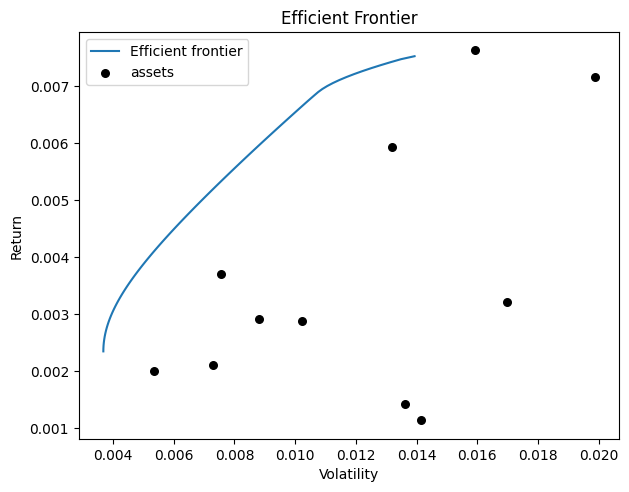

In [ ]:
fig, ax = plt.subplots()
plotting.plot_efficient_frontier(ef, ax=ax, show_assets=True)

plt.title("Efficient Frontier")
plt.show()

In [ ]:
opt_port = pd.DataFrame(index = returns_df.columns.to_list(),columns=["optimized_portfolio_with_no_analyst_opinion","opinion_adjusted_optimized_portfolio","opinion_and_confidence_adjusted_portfolio"])
opt_port

,optimized_portfolio_with_no_analyst_opinion,opinion_adjusted_optimized_portfolio,opinion_and_confidence_adjusted_portfolio
AKT,NaN,NaN,NaN
ATW,NaN,NaN,NaN
BOA,NaN,NaN,NaN
BCP,NaN,NaN,NaN
MDP,NaN,NaN,NaN
MUT,NaN,NaN,NaN
IAM,NaN,NaN,NaN
RIS,NaN,NaN,NaN
TGC,NaN,NaN,NaN
ADI,NaN,NaN,NaN


In [ ]:
opt_port_no_short = opt_port.copy()

In [ ]:
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.risk_models import CovarianceShrinkage
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt.expected_returns import returns_from_prices

In [ ]:
bl_returns = fr["returns_adjusted_for_opinions_and_confidence"] - bon_tresor

In [ ]:
ef = EfficientFrontier(bl_returns, covariance)
ef.add_objective(lambda w: 0.01 * cp.norm(w, 2))
weights = ef.max_sharpe()
clean_weights = ef.clean_weights()
clean_weights

OrderedDict([('AKT', 0.3539),
             ('ATW', 0.046),
             ('BOA', 0.06787),
             ('BCP', 0.0),
             ('MDP', 0.0),
             ('MUT', 0.01462),
             ('IAM', 0.0),
             ('RIS', 0.01536),
             ('TGC', 0.3403),
             ('ADI', 0.15276),
             ('IMO', 0.00919)])

In [ ]:
clean_weights, weights

(OrderedDict([('AKT', 0.39722),
              ('ATW', 0.0),
              ('BOA', 0.08586),
              ('BCP', 0.0),
              ('MDP', 0.0),
              ('MUT', 0.00445),
              ('IAM', 0.0),
              ('RIS', 0.00334),
              ('TGC', 0.36327),
              ('ADI', 0.1454),
              ('IMO', 0.00046)]),
 OrderedDict([('AKT', 0.3972216342262972),
              ('ATW', 1e-16),
              ('BOA', 0.0858643534103549),
              ('BCP', 6e-16),
              ('MDP', 5e-16),
              ('MUT', 0.0044503715848731),
              ('IAM', 4e-16),
              ('RIS', 0.0033426243396182),
              ('TGC', 0.363268936996138),
              ('ADI', 0.1453953112384515),
              ('IMO', 0.0004567682042648)]))

In [ ]:
import cvxpy as cp


mu = fr["returns_adjusted_for_opinions_and_confidence"].values - bon_tresor
Sigma = covariance.values

# Regularize covariance matrix (very important)
epsilon = 1e-6  # or tune this
Sigma_reg = Sigma + epsilon * np.eye(Sigma.shape[0])

n = len(mu)
w = cp.Variable(n)


target_return = 0.02
objective = cp.Minimize(cp.quad_form(w, Sigma_reg))
constraints = [cp.sum(w) == 1, w >= 0, mu @ w >= target_return]


# Solve the QP
prob = cp.Problem(objective, constraints)
prob.solve()


opt_port_no_short["opinion_and_confidence_adjusted_portfolio"] = w.value


opt_port_no_short

C:\Users\carin\AppData\Local\Programs\Python\Python310\lib\site-packages\cvxpy\problems\problem.py:1504: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  warnings.warn(


,optimized_portfolio_with_no_analyst_opinion,opinion_adjusted_optimized_portfolio,opinion_and_confidence_adjusted_portfolio
AKT,0.358593,0.486274,None
ATW,0.028265,0.027153,None
BOA,0.101401,0.097410,None
BCP,0.000262,0.000252,None
MDP,0.002039,0.001959,None
MUT,0.006998,0.006723,None
IAM,0.137797,-0.267533,None
RIS,0.055199,-0.032646,None
TGC,0.251566,0.436858,None
ADI,0.047165,0.233257,None


In [ ]:
opt_port_no_short["opinion_and_confidence_adjusted_portfolio"].to_list()

[-2.4683348550715446e-22,
 -2.194531987467174e-22,
 -3.299561298418216e-22,
 -2.1895572032774872e-22,
 -3.299022106720153e-22,
 -2.190329340562629e-22,
 -3.2961059317608746e-22,
 -3.299430159198223e-22,
 1.0,
 -3.0231468341564414e-22,
 -3.3038231083190937e-22]

In [ ]:
returns_adj = fr["expected_benchmark_returns_with_no_opininon"].values - bon_tresor
cov_inv = np.linalg.inv(covariance.values)

numerator = cov_inv @ returns_adj
denominator = np.sum(numerator)

opt_port["optimized_portfolio_with_no_analyst_opinion"] = numerator / denominator


In [ ]:
numerator, denominator

(array([1.39321169e+01, 1.09816510e+00, 3.93963465e+00, 1.01755270e-02,
        7.92342354e-02, 2.71895475e-01, 5.35369884e+00, 2.14459542e+00,
        9.77387927e+00, 1.83246634e+00, 4.16316108e-01]),
 38.852177833324276)

In [ ]:
opt_port

,optimized_portfolio_with_no_analyst_opinion,opinion_adjusted_optimized_portfolio,opinion_and_confidence_adjusted_portfolio
AKT,0.358593,NaN,NaN
ATW,0.028265,NaN,NaN
BOA,0.101401,NaN,NaN
BCP,0.000262,NaN,NaN
MDP,0.002039,NaN,NaN
MUT,0.006998,NaN,NaN
IAM,0.137797,NaN,NaN
RIS,0.055199,NaN,NaN
TGC,0.251566,NaN,NaN
ADI,0.047165,NaN,NaN


In [ ]:
returns_adj = fr["returns_adjusted_for_opinions"].values - bon_tresor
cov_inv = np.linalg.inv(covariance.values)

numerator = cov_inv @ returns_adj
denominator = np.sum(numerator)

opt_port["opinion_adjusted_optimized_portfolio"] = numerator / denominator
opt_port["opinion_adjusted_optimized_portfolio"].sum()


1.0000000000000002

In [ ]:
returns_adj = fr["returns_adjusted_for_opinions_and_confidence"].values - bon_tresor
cov_inv = np.linalg.inv(covariance.values)

numerator = cov_inv @ returns_adj
denominator = np.sum(numerator)

opt_port["opinion_and_confidence_adjusted_portfolio"] = numerator / denominator
opt_port


,optimized_portfolio_with_no_analyst_opinion,opinion_adjusted_optimized_portfolio,opinion_and_confidence_adjusted_portfolio
AKT,0.358593,0.486274,0.436427
ATW,0.028265,0.027153,0.027587
BOA,0.101401,0.097410,0.098968
BCP,0.000262,0.000252,0.000256
MDP,0.002039,0.001959,0.001990
MUT,0.006998,0.006723,0.006830
IAM,0.137797,-0.267533,-0.109291
RIS,0.055199,-0.032646,0.001649
TGC,0.251566,0.436858,0.364519
ADI,0.047165,0.233257,0.160606


In [ ]:
fr

,expected_benchmark_returns_with_no_opininon,analyst_opinion,returns_adjusted_for_opinions,returns_adjusted_for_opinions_and_confidence
AKT,0.005196,0.001,0.005924,0.005633
ATW,0.003326,0.000,0.003703,0.003552
BOA,0.002850,0.000,0.002908,0.002884
BCP,0.002401,0.000,0.002105,0.002224
MDP,0.002026,0.000,0.001137,0.001492
MUT,0.002579,0.000,0.002872,0.002755
IAM,0.003763,-0.003,0.001429,0.002363
RIS,0.003680,-0.001,0.003202,0.003393
TGC,0.005088,0.002,0.007619,0.006607
ADI,0.004414,0.003,0.007150,0.006055


In [ ]:
opt_port["opinion_and_confidence_adjusted_portfolio"].values.transpose() @ fr["returns_adjusted_for_opinions_and_confidence"].values

0.006013189786785443